In [1]:
import numpy as np
import pandas as pd
pd.set_option("display.max_colwidth", None)
import matplotlib.pyplot as plt


from sklearn.preprocessing import OrdinalEncoder
import torch
from torch import nn
import torch.functional as F
from torch.utils.data import DataLoader, Subset, random_split, WeightedRandomSampler

from torchvision.transforms import InterpolationMode
from torchvision import models
from torchvision.datasets import VisionDataset
from torchvision.transforms import ToTensor, Resize, Normalize, Compose, RandomResizedCrop, ColorJitter, RandomHorizontalFlip, RandomPerspective, RandomRotation, InterpolationMode, RandomApply, GaussianBlur

import random
from sklearn.metrics import f1_score, precision_score, recall_score, roc_auc_score, balanced_accuracy_score
from sklearn.model_selection import train_test_split

from PIL import Image

from tqdm import tqdm
import re

import os
import requests

import warnings
warnings.filterwarnings("ignore")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

#### Разберемся в данных

In [ ]:
data = pd.read_excel("inspection_results.xlsx", engine="openpyxl")

In [ ]:
df = data.copy()

In [ ]:
df

,Фотографии (ссылки),Задачи для пункта,ID,Раздел пункта,Категория пункта,Вопрос,Описание пункта,Тип,Ответ (текст в зависимости от типа пункта),"Результат пункта, баллов",...,Кол-во задач к проверке,Кол-во исправленных задач,Кол-во фото в проверке,Кол-во видео в проверке,Кол-во аудио в проверке,Кол-во ШК в проверке,Координаты устройства,Геопозиция старта проверки,Ссылка на проверку,Гостевая ссылка на проверку
0,NaN,NaN,177104871,Проверка,Пункты,Содержание строительных площадок,NaN,Выбор из списка,Правильно,0,...,0,0,4,0,0,0,55.897003 37.577103,55.898682 37.584686,https://ckkb-mos.online/inspections/4108578/view,https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
1,NaN,NaN,177104872,Проверка,Пункты,Содержание мест проведения работ по ремонту инженерных сооружений,NaN,Выбор из списка,Правильно,0,...,0,0,4,0,0,0,55.897003 37.577103,55.898682 37.584686,https://ckkb-mos.online/inspections/4108578/view,https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
2,NaN,NaN,177104873,Проверка,Пункты,Содержание мест проведения работ по комплексному благоустройству,NaN,Выбор из списка,Правильно,0,...,0,0,4,0,0,0,55.897003 37.577103,55.898682 37.584686,https://ckkb-mos.online/inspections/4108578/view,https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
3,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/1xT4OxIM1Yuq.jpg,NaN,177104874,Проверка,Пункты,"Содержание дорог, мафов, остановочных павильонов, опор уно, опор мосгортранс",NaN,Выбор из списка,НАРУШЕНИЕ,0,...,0,0,4,0,0,0,55.897003 37.577103,55.898682 37.584686,https://ckkb-mos.online/inspections/4108578/view,https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
4,NaN,NaN,177104875,Проверка,Пункты,Содержание рекламных конструкций,NaN,Выбор из списка,Правильно,0,...,0,0,4,0,0,0,55.897003 37.577103,55.898682 37.584686,https://ckkb-mos.online/inspections/4108578/view,https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35645,NaN,NaN,239553397,Проверка,Пункты,Нарушение состояния фасада жилых зданий,NaN,Выбор из списка,NaN,0,...,0,0,1,0,0,0,NaN,55.774357 37.669362,https://ckkb-mos.online/inspections/5614797/view,https://ckkb-mos.online/link/gKJHpzIuii2IJCd9S6S1X0O72qT90B9M
35646,NaN,NaN,239553398,Проверка,Пункты,Нарушение состояния фасада жилых зданий,NaN,Выбор из списка,NaN,0,...,0,0,1,0,0,0,NaN,55.774357 37.669362,https://ckkb-mos.online/inspections/5614797/view,https://ckkb-mos.online/link/gKJHpzIuii2IJCd9S6S1X0O72qT90B9M
35647,NaN,NaN,239553399,Проверка,Пункты,Нарушение состояния фасада жилых зданий,NaN,Выбор из списка,NaN,0,...,0,0,1,0,0,0,NaN,55.774357 37.669362,https://ckkb-mos.online/inspections/5614797/view,https://ckkb-mos.online/link/gKJHpzIuii2IJCd9S6S1X0O72qT90B9M
35648,NaN,NaN,239553400,Проверка,Пункты,Наличие сухостойных деревьев (только деревья),NaN,Выбор из списка,NaN,0,...,0,0,1,0,0,0,NaN,55.774357 37.669362,https://ckkb-mos.online/inspections/5614797/view,https://ckkb-mos.online/link/gKJHpzIuii2IJCd9S6S1X0O72qT90B9M


In [ ]:
df.rename(columns={"Ответ (текст в зависимости от типа пункта)": "attr_val", "Вопрос": "attr", "Фотографии (ссылки)": "img"}, inplace=True)

In [ ]:
target = df["attr_val"]
target[target == "Изначально правильно"] = "Правильно"
target[target == "Прошлое нарушение ИСПРАВЛЕНО"] = "Правильно"
target[target == "Прошлое нарушение НЕ ИСПРАВЛЕНО"] = "НАРУШЕНИЕ"
target[target == "Выявлено впервые"] = "НАРУШЕНИЕ"
df["attr_val"] = target

In [ ]:
df["attr_val"].isna().sum()

8798

In [ ]:
df.shape[0]

35650

In [ ]:
df_clean = df[["img", "attr", "attr_val", "ID", "Комментарий", "Гостевая ссылка на проверку"]]

In [ ]:
df_clean = df_clean[~df_clean["attr_val"].isna()]

In [ ]:
df_clean["img"].isna().sum() / df_clean.shape[0]

0.5509086846417399

In [ ]:
df_clean[~df_clean["img"].isna()][df_clean["attr_val"] == "Правильно"].shape

(8029, 6)

In [ ]:
df_clean = df_clean[~df_clean["img"].isna()]

In [ ]:
df_clean

,img,attr,attr_val,ID,Комментарий,Гостевая ссылка на проверку
3,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/1xT4OxIM1Yuq.jpg,"Содержание дорог, мафов, остановочных павильонов, опор уно, опор мосгортранс",НАРУШЕНИЕ,177104874,Череповетская ул. д.14,https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
5,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/KQlpdUvDLxef.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/YpP2fpXi5rRh.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/zPBW2zALQyfq.jpg,Содержание фасадов нежилых зданий и сооружений,НАРУШЕНИЕ,177104876,", череповетская д.14 а",https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
105,https://ckkb-mos.online/storage/uploads/images/10645/92727/4108588/8AKFil1qd3J1.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/92727/4108588/r1dIvGBjMQDv.jpg,Содержание фасадов нежилых зданий и сооружений,НАРУШЕНИЕ,177104996,"Д.18, школа д.12",https://ckkb-mos.online/link/s03oi5QVVPE0trTkghjJEYNUYAntJHwu
155,https://ckkb-mos.online/storage/uploads/images/10645/92766/4108593/LTGXnWbOrVx3.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/92766/4108593/nnWqdEax4kgF.jpg,Содержание фасадов нежилых зданий и сооружений,НАРУШЕНИЕ,177105056,NaN,https://ckkb-mos.online/link/uf3orfegFtx18hqdKFQnvhYjQM3IuQyT
203,https://ckkb-mos.online/storage/uploads/images/10645/92787/4108598/BbEOlBR37v9L.jpg,"Содержание дорог, мафов, остановочных павильонов, опор уно, опор мосгортранс",НАРУШЕНИЕ,177105114,NaN,https://ckkb-mos.online/link/bDYOg7meLs4P5VFDPmPR6G2biL2ckdtt
...,...,...,...,...,...,...
35615,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/pyjGuNcP30Uc.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/wDpkEfWK20o4.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/w8HrU9NUCwtn.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/IdWapooblvVR.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/taoQlhanUDMl.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/ljKVPz71gxtu.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/NLzdYnvPEItB.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/ItVX0w3snej0.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/aAc8cfhIv5xT.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/zjKFk8jg2Hr1.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/oFKD1ViP0qx6.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/RR6KsUyMLMO7.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/aY8PhBr56E6E.jpg,"Нарушения по санитарии, освещению, ТПУ, полосе отвода ж\д",НАРУШЕНИЕ,233603594,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
35618,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/pPc3BAxjG7kr.jpg,Нарушение состояния фасада жилых зданий,НАРУШЕНИЕ,233603597,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
35619,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/u1TOGblQqlth.jpg,Наличие сухостойных деревьев (только деревья),НАРУШЕНИЕ,233603598,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
35620,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/5lKbsppJmRrQ.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/hEvZzoZDvazo.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/pIz1wRo7PMbf.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/EOE1BbXM18LO.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/Wm7XbGtAoGFz.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/DZfvZE4vhX12.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/XSFn5Ah

In [ ]:
oe = OrdinalEncoder(categories=[["Правильно", "НАРУШЕНИЕ"]]).fit(df_clean[["attr_val"]])
df_clean[["attr_val"]] = oe.transform(df_clean[["attr_val"]])
df_clean

,img,attr,attr_val,ID,Комментарий,Гостевая ссылка на проверку
3,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/1xT4OxIM1Yuq.jpg,"Содержание дорог, мафов, остановочных павильонов, опор уно, опор мосгортранс",1.0,177104874,Череповетская ул. д.14,https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
5,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/KQlpdUvDLxef.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/YpP2fpXi5rRh.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/zPBW2zALQyfq.jpg,Содержание фасадов нежилых зданий и сооружений,1.0,177104876,", череповетская д.14 а",https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
105,https://ckkb-mos.online/storage/uploads/images/10645/92727/4108588/8AKFil1qd3J1.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/92727/4108588/r1dIvGBjMQDv.jpg,Содержание фасадов нежилых зданий и сооружений,1.0,177104996,"Д.18, школа д.12",https://ckkb-mos.online/link/s03oi5QVVPE0trTkghjJEYNUYAntJHwu
155,https://ckkb-mos.online/storage/uploads/images/10645/92766/4108593/LTGXnWbOrVx3.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/92766/4108593/nnWqdEax4kgF.jpg,Содержание фасадов нежилых зданий и сооружений,1.0,177105056,NaN,https://ckkb-mos.online/link/uf3orfegFtx18hqdKFQnvhYjQM3IuQyT
203,https://ckkb-mos.online/storage/uploads/images/10645/92787/4108598/BbEOlBR37v9L.jpg,"Содержание дорог, мафов, остановочных павильонов, опор уно, опор мосгортранс",1.0,177105114,NaN,https://ckkb-mos.online/link/bDYOg7meLs4P5VFDPmPR6G2biL2ckdtt
...,...,...,...,...,...,...
35615,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/pyjGuNcP30Uc.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/wDpkEfWK20o4.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/w8HrU9NUCwtn.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/IdWapooblvVR.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/taoQlhanUDMl.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/ljKVPz71gxtu.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/NLzdYnvPEItB.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/ItVX0w3snej0.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/aAc8cfhIv5xT.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/zjKFk8jg2Hr1.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/oFKD1ViP0qx6.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/RR6KsUyMLMO7.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/aY8PhBr56E6E.jpg,"Нарушения по санитарии, освещению, ТПУ, полосе отвода ж\д",1.0,233603594,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
35618,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/pPc3BAxjG7kr.jpg,Нарушение состояния фасада жилых зданий,1.0,233603597,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
35619,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/u1TOGblQqlth.jpg,Наличие сухостойных деревьев (только деревья),1.0,233603598,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
35620,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/5lKbsppJmRrQ.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/hEvZzoZDvazo.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/pIz1wRo7PMbf.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/EOE1BbXM18LO.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/Wm7XbGtAoGFz.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/DZfvZE4vhX12.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/XSFn5AhMo3aA.jpg\n\nhttps://ckkb-mos.online/storage/upl

In [ ]:
df_clean["attr"].value_counts()

attr
Нарушение содержания фасадов нежилых зданий и сооружений                                    1267
Нарушения в содержание дорог, МАФов, остановочных павильонов, опор УНО, опор мосгортранс    1174
Нарушения по санитарии, освещению, ТПУ, полосе отвода ж\д                                   1143
Нарушение состояния фасада жилых зданий                                                     1121
Нарушение содержания объектов ЦОДД                                                          1107
Наличие подтоплений                                                                         1059
Нарушение содержания мест проведения работ по ремонту инженерных сооружений                 1054
Нарушение содержания объектов гор.моста                                                     1041
Нарушение содержания рекламных конструкций                                                  1019
Содержание фасадов нежилых зданий и сооружений                                               462
Содержание дорог, мафов, 

In [ ]:
df_clean_group = df_clean.groupby(["attr"])["attr_val"].sum().sort_values()
df_clean_group

attr
Содержание рекламных конструкций                                                             29.0
Содержание объектов гормоста                                                                 31.0
Неудовлетворительное содержание ОЛХ                                                          38.0
Нарушение содержания строительной площадки                                                   49.0
Нарушение содержания рекламных конструкций                                                   55.0
Нарушение содержания мест проведения работ по комплексному благоустройству                   56.0
Наличие сухостойных деревьев (только деревья)                                                58.0
Содержание мест проведения работ по ремонту инженерных сооружений                            82.0
Нарушение содержания мест проведения работ по ремонту инженерных сооружений                  95.0
Нарушение содержания объектов гор.моста                                                     103.0
Наличие подтопл

In [ ]:
good_classes = df_clean_group[df_clean_group > 100].index.to_list()
good_classes

['Нарушение содержания объектов гор.моста',
 'Наличие подтоплений',
 'Содержание объектов цодд',
 'Содержание строительных площадок',
 'Нарушение содержания объектов ЦОДД',
 'Нарушение состояния фасада жилых зданий',
 'Содержание мест проведения работ по комплексному благоустройству',
 'Санитария (уборка), освещение ( работает или нет),тпу, полоса отвода жд',
 'Содержание дорог, мафов, остановочных павильонов, опор уно, опор мосгортранс',
 'Нарушения по санитарии, освещению, ТПУ, полосе отвода ж\\д',
 'Нарушения в содержание дорог, МАФов, остановочных павильонов, опор УНО, опор мосгортранс',
 'Содержание фасадов нежилых зданий и сооружений',
 'Нарушение содержания фасадов нежилых зданий и сооружений']

In [ ]:
#df_good = df_clean[df_clean["attr"].isin(good_classes)]
df_good = df_clean.copy()
df_good

,img,attr,attr_val,ID,Комментарий,Гостевая ссылка на проверку
3,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/1xT4OxIM1Yuq.jpg,"Содержание дорог, мафов, остановочных павильонов, опор уно, опор мосгортранс",1.0,177104874,Череповетская ул. д.14,https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
5,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/KQlpdUvDLxef.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/YpP2fpXi5rRh.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/zPBW2zALQyfq.jpg,Содержание фасадов нежилых зданий и сооружений,1.0,177104876,", череповетская д.14 а",https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
105,https://ckkb-mos.online/storage/uploads/images/10645/92727/4108588/8AKFil1qd3J1.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/92727/4108588/r1dIvGBjMQDv.jpg,Содержание фасадов нежилых зданий и сооружений,1.0,177104996,"Д.18, школа д.12",https://ckkb-mos.online/link/s03oi5QVVPE0trTkghjJEYNUYAntJHwu
155,https://ckkb-mos.online/storage/uploads/images/10645/92766/4108593/LTGXnWbOrVx3.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/92766/4108593/nnWqdEax4kgF.jpg,Содержание фасадов нежилых зданий и сооружений,1.0,177105056,NaN,https://ckkb-mos.online/link/uf3orfegFtx18hqdKFQnvhYjQM3IuQyT
203,https://ckkb-mos.online/storage/uploads/images/10645/92787/4108598/BbEOlBR37v9L.jpg,"Содержание дорог, мафов, остановочных павильонов, опор уно, опор мосгортранс",1.0,177105114,NaN,https://ckkb-mos.online/link/bDYOg7meLs4P5VFDPmPR6G2biL2ckdtt
...,...,...,...,...,...,...
35615,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/pyjGuNcP30Uc.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/wDpkEfWK20o4.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/w8HrU9NUCwtn.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/IdWapooblvVR.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/taoQlhanUDMl.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/ljKVPz71gxtu.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/NLzdYnvPEItB.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/ItVX0w3snej0.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/aAc8cfhIv5xT.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/zjKFk8jg2Hr1.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/oFKD1ViP0qx6.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/RR6KsUyMLMO7.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/aY8PhBr56E6E.jpg,"Нарушения по санитарии, освещению, ТПУ, полосе отвода ж\д",1.0,233603594,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
35618,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/pPc3BAxjG7kr.jpg,Нарушение состояния фасада жилых зданий,1.0,233603597,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
35619,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/u1TOGblQqlth.jpg,Наличие сухостойных деревьев (только деревья),1.0,233603598,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
35620,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/5lKbsppJmRrQ.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/hEvZzoZDvazo.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/pIz1wRo7PMbf.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/EOE1BbXM18LO.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/Wm7XbGtAoGFz.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/DZfvZE4vhX12.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/XSFn5AhMo3aA.jpg\n\nhttps://ckkb-mos.online/storage/upl

In [ ]:
df_good.reset_index(drop=True, inplace=True)

In [ ]:
df_good.shape

(9609, 6)

In [ ]:
df_good

,img,attr,attr_val,ID,Комментарий,Гостевая ссылка на проверку
0,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/1xT4OxIM1Yuq.jpg,"Содержание дорог, мафов, остановочных павильонов, опор уно, опор мосгортранс",1.0,177104874,Череповетская ул. д.14,https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
1,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/KQlpdUvDLxef.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/YpP2fpXi5rRh.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/zPBW2zALQyfq.jpg,Содержание фасадов нежилых зданий и сооружений,1.0,177104876,", череповетская д.14 а",https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
2,https://ckkb-mos.online/storage/uploads/images/10645/92727/4108588/8AKFil1qd3J1.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/92727/4108588/r1dIvGBjMQDv.jpg,Содержание фасадов нежилых зданий и сооружений,1.0,177104996,"Д.18, школа д.12",https://ckkb-mos.online/link/s03oi5QVVPE0trTkghjJEYNUYAntJHwu
3,https://ckkb-mos.online/storage/uploads/images/10645/92766/4108593/LTGXnWbOrVx3.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/92766/4108593/nnWqdEax4kgF.jpg,Содержание фасадов нежилых зданий и сооружений,1.0,177105056,NaN,https://ckkb-mos.online/link/uf3orfegFtx18hqdKFQnvhYjQM3IuQyT
4,https://ckkb-mos.online/storage/uploads/images/10645/92787/4108598/BbEOlBR37v9L.jpg,"Содержание дорог, мафов, остановочных павильонов, опор уно, опор мосгортранс",1.0,177105114,NaN,https://ckkb-mos.online/link/bDYOg7meLs4P5VFDPmPR6G2biL2ckdtt
...,...,...,...,...,...,...
12054,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/pyjGuNcP30Uc.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/wDpkEfWK20o4.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/w8HrU9NUCwtn.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/IdWapooblvVR.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/taoQlhanUDMl.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/ljKVPz71gxtu.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/NLzdYnvPEItB.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/ItVX0w3snej0.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/aAc8cfhIv5xT.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/zjKFk8jg2Hr1.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/oFKD1ViP0qx6.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/RR6KsUyMLMO7.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/aY8PhBr56E6E.jpg,"Нарушения по санитарии, освещению, ТПУ, полосе отвода ж\д",1.0,233603594,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
12055,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/pPc3BAxjG7kr.jpg,Нарушение состояния фасада жилых зданий,1.0,233603597,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
12056,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/u1TOGblQqlth.jpg,Наличие сухостойных деревьев (только деревья),1.0,233603598,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
12057,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/5lKbsppJmRrQ.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/hEvZzoZDvazo.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/pIz1wRo7PMbf.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/EOE1BbXM18LO.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/Wm7XbGtAoGFz.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/DZfvZE4vhX12.jpg\n\nhttps://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/XSFn5AhMo3aA.jpg\n\nhttps://ckkb-mos.online/storage/uploads/i

In [ ]:
links = df_good["img"]
links = links.apply(lambda x: [y for y in re.split("\s", x) if y])

df_atom = df_good.assign(img=links).explode("img").reset_index(drop=True)
df_atom

,img,attr,attr_val,ID,Комментарий,Гостевая ссылка на проверку
0,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/1xT4OxIM1Yuq.jpg,"Содержание дорог, мафов, остановочных павильонов, опор уно, опор мосгортранс",1.0,177104874,Череповетская ул. д.14,https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
1,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/KQlpdUvDLxef.jpg,Содержание фасадов нежилых зданий и сооружений,1.0,177104876,", череповетская д.14 а",https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
2,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/YpP2fpXi5rRh.jpg,Содержание фасадов нежилых зданий и сооружений,1.0,177104876,", череповетская д.14 а",https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
3,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/zPBW2zALQyfq.jpg,Содержание фасадов нежилых зданий и сооружений,1.0,177104876,", череповетская д.14 а",https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
4,https://ckkb-mos.online/storage/uploads/images/10645/92727/4108588/8AKFil1qd3J1.jpg,Содержание фасадов нежилых зданий и сооружений,1.0,177104996,"Д.18, школа д.12",https://ckkb-mos.online/link/s03oi5QVVPE0trTkghjJEYNUYAntJHwu
...,...,...,...,...,...,...
24742,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/Wm7XbGtAoGFz.jpg,Неудовлетворительное содержание ОЛХ,1.0,233603599,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
24743,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/DZfvZE4vhX12.jpg,Неудовлетворительное содержание ОЛХ,1.0,233603599,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
24744,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/XSFn5AhMo3aA.jpg,Неудовлетворительное содержание ОЛХ,1.0,233603599,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
24745,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/q5FlWpp0dDyT.jpg,Неудовлетворительное содержание ОЛХ,1.0,233603599,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW


In [ ]:
df_atom.groupby("attr").count()

,img,attr_val,ID,Комментарий,Гостевая ссылка на проверку
attr,,,,,
Наличие подтоплений,1166,1166,1166,66,1166
Наличие сухостойных деревьев (только деревья),262,262,262,10,262
Нарушение содержания мест проведения работ по комплексному благоустройству,172,172,172,137,172
Нарушение содержания мест проведения работ по ремонту инженерных сооружений,1205,1205,1205,169,1205
Нарушение содержания объектов ЦОДД,1366,1366,1366,194,1366
Нарушение содержания объектов гор.моста,1434,1434,1434,191,1434
Нарушение содержания рекламных конструкций,1037,1037,1037,77,1037
Нарушение содержания строительной площадки,140,140,140,92,140
Нарушение содержания фасадов нежилых зданий и сооружений,4639,4639,4639,1330,4639


In [ ]:
df_atom.groupby("attr").count().sort_values("ID")

,img,attr_val,ID,Комментарий,Гостевая ссылка на проверку
attr,,,,,
Содержание рекламных конструкций,36,36,36,18,36
Содержание объектов гормоста,93,93,93,35,93
Нарушение содержания строительной площадки,140,140,140,92,140
Нарушение содержания мест проведения работ по комплексному благоустройству,172,172,172,137,172
Содержание мест проведения работ по ремонту инженерных сооружений,177,177,177,104,177
Неудовлетворительное содержание ОЛХ,177,177,177,22,177
Наличие сухостойных деревьев (только деревья),262,262,262,10,262
Содержание объектов цодд,341,341,341,200,341
Содержание строительных площадок,501,501,501,206,501


In [ ]:
df_atom[df_atom["attr"] == "Нарушение содержания фасадов нежилых зданий и сооружений"]

,img,attr,attr_val,ID,Комментарий,Гостевая ссылка на проверку
5591,https://ckkb-mos.online/storage/uploads/images/10645/92033/4113876/M0oKlonifNlE.jpg,Нарушение содержания фасадов нежилых зданий и сооружений,1.0,177319858,NaN,https://ckkb-mos.online/link/DSlX4RBxxTB2NmUwFaocIRiXLaNWQaep
5592,https://ckkb-mos.online/storage/uploads/images/10645/92033/4113876/5BrZUlkHUH4e.jpg,Нарушение содержания фасадов нежилых зданий и сооружений,1.0,177319858,NaN,https://ckkb-mos.online/link/DSlX4RBxxTB2NmUwFaocIRiXLaNWQaep
5596,https://ckkb-mos.online/storage/uploads/images/10645/92186/4113877/fANeZEiyt6S4.jpg,Нарушение содержания фасадов нежилых зданий и сооружений,1.0,177319871,NaN,https://ckkb-mos.online/link/DtLBbnbTB3mSqEFY1xT7Ge6pubV25GxT
5601,https://ckkb-mos.online/storage/uploads/images/10645/92721/4113880/43hyxn33XBOq.jpg,Нарушение содержания фасадов нежилых зданий и сооружений,1.0,177319910,NaN,https://ckkb-mos.online/link/MTKQQuR4i1fzDC4lHVlIQcO7sVtEVjA6
5602,https://ckkb-mos.online/storage/uploads/images/10645/92723/4113882/ZYm2YWB54rKx.jpg,Нарушение содержания фасадов нежилых зданий и сооружений,1.0,177319936,NaN,https://ckkb-mos.online/link/FjWf6rjtKRy8z1zMAjCMqCnnZPlDL2tL
...,...,...,...,...,...,...
21389,https://ckkb-mos.online/storage/uploads/images/10645/147576/5456245/lrSyTSxxKglp.jpg,Нарушение содержания фасадов нежилых зданий и сооружений,1.0,233547802,NaN,https://ckkb-mos.online/link/f6tpGRLSvnCNVTaKWpyswgSRpqGcx6LG
21422,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/yW2g0Ag24IqS.jpg,Нарушение содержания фасадов нежилых зданий и сооружений,1.0,233603582,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
21423,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/Uv6JdS7tIuMZ.jpg,Нарушение содержания фасадов нежилых зданий и сооружений,1.0,233603582,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
21424,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/pS33gw9aAci5.jpg,Нарушение содержания фасадов нежилых зданий и сооружений,1.0,233603582,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW


In [ ]:
data = df_atom
data

,img,attr,attr_val,ID,img_num,Комментарий,Гостевая ссылка на проверку
0,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/1xT4OxIM1Yuq.jpg,"Содержание дорог, мафов, остановочных павильонов, опор уно, опор мосгортранс",1.0,177104874,0,Череповетская ул. д.14,https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
1,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/KQlpdUvDLxef.jpg,Содержание фасадов нежилых зданий и сооружений,1.0,177104876,0,", череповетская д.14 а",https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
2,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/YpP2fpXi5rRh.jpg,Содержание фасадов нежилых зданий и сооружений,1.0,177104876,1,", череповетская д.14 а",https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
3,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/zPBW2zALQyfq.jpg,Содержание фасадов нежилых зданий и сооружений,1.0,177104876,2,", череповетская д.14 а",https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
4,https://ckkb-mos.online/storage/uploads/images/10645/92727/4108588/8AKFil1qd3J1.jpg,Содержание фасадов нежилых зданий и сооружений,1.0,177104996,0,"Д.18, школа д.12",https://ckkb-mos.online/link/s03oi5QVVPE0trTkghjJEYNUYAntJHwu
...,...,...,...,...,...,...,...
24742,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/Wm7XbGtAoGFz.jpg,Неудовлетворительное содержание ОЛХ,1.0,233603599,4,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
24743,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/DZfvZE4vhX12.jpg,Неудовлетворительное содержание ОЛХ,1.0,233603599,5,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
24744,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/XSFn5AhMo3aA.jpg,Неудовлетворительное содержание ОЛХ,1.0,233603599,6,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
24745,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/q5FlWpp0dDyT.jpg,Неудовлетворительное содержание ОЛХ,1.0,233603599,7,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW


In [ ]:
noise_img = os.listdir(os.path.join(root_dir, "noise_images"))

In [ ]:
df_atom[df_atom["attr"] == "Нарушение состояния фасада жилых зданий"]["attr_val"]

5595     1.0
5600     1.0
5656     1.0
5712     1.0
5730     1.0
        ... 
21405    1.0
21406    1.0
21407    1.0
21408    1.0
21447    1.0
Name: attr_val, Length: 2068, dtype: float64

In [ ]:
df_atom.drop("img_num", axis=1, inplace=True)

In [ ]:
counts = np.zeros(df_atom.shape[0])
prev_id = -1
for (ind, id) in enumerate(df_atom["ID"]):
    if prev_id == id:
        counts[ind] = counts[ind - 1] + 1
    prev_id = id

In [ ]:
df_atom.insert(df_atom.columns.get_loc("ID") + 1, "img_num", counts)

In [ ]:
df_atom.to_csv("data/data_final.csv", index=False)

In [ ]:
data['img_num'] = data['img_num'].astype(int)

In [ ]:
data.to_csv("data/data_final.csv", index=False)

In [ ]:
replacement = {r"Содержание дорог, мафов, остановочных павильонов, опор уно, опор мосгортранс": r"Нарушения в содержание дорог, МАФов, остановочных павильонов, опор УНО, опор мосгортранс",
               r"Содержание фасадов нежилых зданий и сооружений": r"Нарушение содержания фасадов нежилых зданий и сооружений",
               r"Санитария (уборка), освещение ( работает или нет),тпу, полоса отвода жд": r"Нарушения по санитарии, освещению, ТПУ, полосе отвода ж\д",
               r"Содержание мест проведения работ по комплексному благоустройству": r"Нарушение содержания мест проведения работ по комплексному благоустройству",
               r"Содержание рекламных конструкций": r"Нарушение содержания рекламных конструкций",
               r"Содержание объектов гормоста": r"Нарушение содержания объектов гор.моста",
               r"Содержание строительных площадок": r"Нарушение содержания строительной площадки",
               r"Содержание мест проведения работ по ремонту инженерных сооружений": r"Нарушение содержания мест проведения работ по ремонту инженерных сооружений",
               r"Содержание объектов цодд": r"Нарушение содержания объектов ЦОДД",
               }

data.replace(replacement, inplace=True)

,img,attr,attr_val,ID,img_num,Комментарий,Гостевая ссылка на проверку
0,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/1xT4OxIM1Yuq.jpg,"Нарушения в содержание дорог, МАФов, остановочных павильонов, опор УНО, опор мосгортранс",1.0,177104874,0,Череповетская ул. д.14,https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
1,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/KQlpdUvDLxef.jpg,Нарушение содержания фасадов нежилых зданий и сооружений,1.0,177104876,0,", череповетская д.14 а",https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
2,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/YpP2fpXi5rRh.jpg,Нарушение содержания фасадов нежилых зданий и сооружений,1.0,177104876,1,", череповетская д.14 а",https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
3,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/zPBW2zALQyfq.jpg,Нарушение содержания фасадов нежилых зданий и сооружений,1.0,177104876,2,", череповетская д.14 а",https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
4,https://ckkb-mos.online/storage/uploads/images/10645/92727/4108588/8AKFil1qd3J1.jpg,Нарушение содержания фасадов нежилых зданий и сооружений,1.0,177104996,0,"Д.18, школа д.12",https://ckkb-mos.online/link/s03oi5QVVPE0trTkghjJEYNUYAntJHwu
...,...,...,...,...,...,...,...
24742,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/Wm7XbGtAoGFz.jpg,Неудовлетворительное содержание ОЛХ,1.0,233603599,4,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
24743,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/DZfvZE4vhX12.jpg,Неудовлетворительное содержание ОЛХ,1.0,233603599,5,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
24744,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/XSFn5AhMo3aA.jpg,Неудовлетворительное содержание ОЛХ,1.0,233603599,6,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
24745,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/q5FlWpp0dDyT.jpg,Неудовлетворительное содержание ОЛХ,1.0,233603599,7,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW


In [ ]:
data["attr"].unique()

<StringArray>
['Нарушения в содержание дорог, МАФов, остановочных павильонов, опор УНО, опор мосгортранс',
                                 'Нарушение содержания фасадов нежилых зданий и сооружений',
                                                  'Нарушение содержания объектов гор.моста',
                                'Нарушения по санитарии, освещению, ТПУ, полосе отвода ж\д',
                                               'Нарушение содержания строительной площадки',
               'Нарушение содержания мест проведения работ по комплексному благоустройству',
              'Нарушение содержания мест проведения работ по ремонту инженерных сооружений',
                                                                      'Наличие подтоплений',
                                                       'Нарушение содержания объектов ЦОДД',
                                               'Нарушение содержания рекламных конструкций',
                                                  'Наруш

In [ ]:
data

,img,attr,attr_val,ID,img_num,Комментарий,Гостевая ссылка на проверку
0,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/1xT4OxIM1Yuq.jpg,"Нарушения в содержание дорог, МАФов, остановочных павильонов, опор УНО, опор мосгортранс",1.0,177104874,0,Череповетская ул. д.14,https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
1,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/KQlpdUvDLxef.jpg,Нарушение содержания фасадов нежилых зданий и сооружений,1.0,177104876,0,", череповетская д.14 а",https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
2,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/YpP2fpXi5rRh.jpg,Нарушение содержания фасадов нежилых зданий и сооружений,1.0,177104876,1,", череповетская д.14 а",https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
3,https://ckkb-mos.online/storage/uploads/images/10645/92192/4108578/zPBW2zALQyfq.jpg,Нарушение содержания фасадов нежилых зданий и сооружений,1.0,177104876,2,", череповетская д.14 а",https://ckkb-mos.online/link/TloUtGBhN6jJdW5SZiWY35RaMl1CFPTt
4,https://ckkb-mos.online/storage/uploads/images/10645/92727/4108588/8AKFil1qd3J1.jpg,Нарушение содержания фасадов нежилых зданий и сооружений,1.0,177104996,0,"Д.18, школа д.12",https://ckkb-mos.online/link/s03oi5QVVPE0trTkghjJEYNUYAntJHwu
...,...,...,...,...,...,...,...
24742,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/Wm7XbGtAoGFz.jpg,Неудовлетворительное содержание ОЛХ,1.0,233603599,4,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
24743,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/DZfvZE4vhX12.jpg,Неудовлетворительное содержание ОЛХ,1.0,233603599,5,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
24744,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/XSFn5AhMo3aA.jpg,Неудовлетворительное содержание ОЛХ,1.0,233603599,6,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW
24745,https://ckkb-mos.online/storage/uploads/images/10645/147575/5458016/q5FlWpp0dDyT.jpg,Неудовлетворительное содержание ОЛХ,1.0,233603599,7,NaN,https://ckkb-mos.online/link/BDNsrWbe6nmfRGDkK68fqDkabAxIeJmW


#### Much better

### Скачаем

In [ ]:
root_dir = "data"
img_dir = "images"
csv_path = "data_final.csv"

In [ ]:
os.makedirs(os.path.join(root_dir, img_dir), exist_ok=True)

# ПЕРЕПИСАТЬ ПОД РЕТРАИ
for (ind, url, id, img_num) in tqdm(zip(data.index, data["img"], data["ID"], data["img_num"])):
    try:
        save_path = os.path.join(root_dir, img_dir, str(id) + "_" + str(img_num) + ".jpg")
        if os.path.exists(save_path):
            continue

        response = requests.get(url)
        response.raise_for_status()

        with open(save_path, "wb") as f:
            f.write(response.content)
    except requests.exceptions.RequestException as e:
        print(f"An error occurred: {e}")

24747it [17:35, 23.44it/s]


#### Догрузим то че сломалось

### Попробуем предсказать

In [14]:
root_dir = "data"
img_dir = "images"
csv_path = "data_no_noise.csv"

In [10]:
def get_idx_row_from_image(img_name, data):
    (id, img_num) = img_name.split(".")[0].split("_")
    id = int(id)
    img_num = int(img_num)
    series = data[(data["ID"] == id) & (data["img_num"] == img_num)]
    idx = series.index[0]
    row = series.iloc[0]

    return (idx, row)

In [15]:
class Facade(VisionDataset):
    def __init__(self, root_dir, img_dir, csv_path, attr, transform=None, target_transform=None):
        self.attr = attr
        self.root_dir = root_dir
        self.img_dir = img_dir
        self.csv_path = csv_path

        super().__init__(self.root_dir, transform=transform)

        self.transform = transform
        self.target_transform = target_transform

        self.image_paths = []
        self.labels = []
        self.orig_indices = []

        self._build_dataset()

    def _build_dataset(self):
        data = pd.read_csv(os.path.join(self.root_dir, self.csv_path))
        for img_name in os.listdir(os.path.join(self.root_dir, self.img_dir)):
            #idx = int(img_name.split('.')[0]) // old


            idx, row = get_idx_row_from_image(img_name, data)


            if row.attr != self.attr:
                continue

            self.labels.append(row.attr_val)
            self.orig_indices.append(idx)

            img_path = os.path.join(self.root_dir, self.img_dir, img_name)
            self.image_paths.append(img_path)

        print(f"Dataset loaded: {len(self.image_paths)} images")

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]

        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        if self.target_transform:
            label = self.target_transform(label)

        return image, label

In [ ]:
Нарушение содержания фасадов нежилых зданий и сооружений
Нарушение состояния фасада жилых зданий

In [22]:
data = pd.read_csv(os.path.join(root_dir, csv_path))

In [16]:
data[data["ID"] == 178719982]

NameError: name 'data' is not defined

In [18]:
facade = Facade(root_dir=root_dir, img_dir=img_dir, csv_path=csv_path, attr="Неудовлетворительное содержание ОЛХ")

Dataset loaded: 177 images


In [ ]:
transform = Compose([
    RandomResizedCrop(
        size=(256, 256),
        scale=(0.7, 1.0),
        ratio=(0.9, 1.1),
        interpolation=InterpolationMode.BILINEAR
    ),
    RandomHorizontalFlip(p=0.5),

    ColorJitter(
        brightness=0.2,
        contrast=0.3,
        saturation=0.15,
        hue=0.05
    ),

    RandomApply([
        GaussianBlur(kernel_size=3, sigma=(0.1, 0.7))
    ], p=0.2),

    RandomApply([
        RandomRotation(
            degrees=7,
            interpolation=InterpolationMode.BILINEAR
        )
    ], p=0.3),

    RandomApply([
        RandomPerspective(
            distortion_scale=0.15,
            p=1.0,
            interpolation=InterpolationMode.BILINEAR
        )
    ], p=0.2),
])

facade.transform = transform

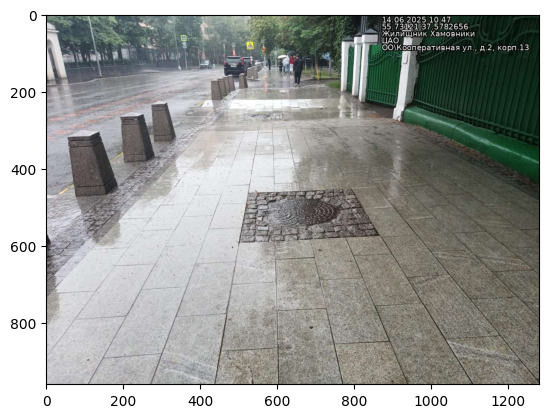

1.0
18890


Unnamed: 0                                                                                                    22264
img                            https://ckkb-mos.online/storage/uploads/images/10645/147620/5451906/y8MdxEKQanWP.jpg
attr                                                                            Неудовлетворительное содержание ОЛХ
attr_val                                                                                                        1.0
ID                                                                                                        233393522
img_num                                                                                                           5
Комментарий                                                                                                     NaN
Гостевая ссылка на проверку                           https://ckkb-mos.online/link/q4hwMJCM4WXmZmUlDrWA5gCgVdwejF27
Name: 18890, dtype: object

In [27]:
ind = 5
plt.imshow(facade[ind][0])
plt.show()
print(facade[ind][1])
print(facade.orig_indices[ind])
data.iloc[facade.orig_indices[ind]]

In [ ]:
transform = Compose(
    [Resize((384, 384)), ToTensor(), Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])]
)

ds = Facade(transform=transform, root_dir=root_dir, img_dir=img_dir, csv_path=csv_path, attr="Нарушение состояния фасада жилых зданий")

Dataset loaded: 1648 images


In [ ]:
train_test_split = 0.6
train_val_split = 0.95
train_size = int(train_test_split * len(ds))
test_size = len(ds) - train_size
val_size = train_size - int(train_size * train_val_split)
train_size = int(train_size * train_val_split)

generator = torch.Generator().manual_seed(42)
train_ds, val_ds, test_ds = random_split(ds, [train_size, val_size, test_size], generator=generator)

#### Аугментации

In [ ]:
train_transform = Compose([
    RandomResizedCrop(
        size=(384, 384),
        scale=(0.7, 1.0),
        ratio=(0.9, 1.1)
    ),
    RandomHorizontalFlip(p=0.5),

    ColorJitter(
        brightness=0.2,
        contrast=0.3,
        saturation=0.15,
        hue=0.05
    ),

    RandomApply([
        GaussianBlur(kernel_size=3, sigma=(0.1, 0.7))
    ], p=0.2),

    RandomApply([
        RandomRotation(
            degrees=7,
            interpolation=InterpolationMode.BILINEAR
        )
    ], p=0.3),

    RandomApply([
        RandomPerspective(
            distortion_scale=0.15,
            p=1.0
        )
    ], p=0.2),

    ToTensor(),

    Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),
])

default_transform = Compose([
    Resize((384, 384)),
    ToTensor(),
    Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),
])

train_ds.transform = train_transform
val_ds.transform = default_transform
test_ds.transform = default_transform

#### Модельки

In [ ]:
def train_model(model, train_loader, val_loader, epochs, lr, classify_thresh):
    criterion = nn.BCEWithLogitsLoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=0.01, betas=(0.9, 0.999))

    history = {"train_loss": [], "val_acc": [], "val_f1": []}

    for epoch in range(epochs):
        model.train()
        train_loss = 0.0

        print("Training:")
        for x, y in tqdm(train_loader):
            x = x.to(device)
            y = y.to(device).float().view(-1, 1)

            optimizer.zero_grad()
            out = model(x)
            loss = criterion(out, y)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        model.eval()
        all_preds = []
        all_y = []

        print("Validation:")
        with torch.no_grad():
            for x, y in tqdm(val_loader):
                x, y = x.to(device), y.to(device).float()
                out = model(x)

                preds = (torch.sigmoid(out) > classify_thresh).float()
                all_preds.append(preds.cpu())
                all_y.append(y.cpu())

        all_preds = torch.cat(all_preds).numpy().ravel()
        all_y = torch.cat(all_y).numpy().ravel()

        avg_loss = train_loss / len(train_loader)
        val_acc = (all_preds == all_y).mean()
        val_f1 = f1_score(all_y, all_preds, zero_division=0)
        val_precision = precision_score(all_y, all_preds, zero_division=0)
        val_recall = recall_score(all_y, all_preds, zero_division=0)

        print(f"Epoch {epoch+1}/{epochs}:")
        print(f"  Train loss: {avg_loss:.4f}")
        print(f"  Val accuracy: {val_acc:.4f}")
        print(f"  Val f1: {val_f1:.4f}")
        print(f"  Val precision: {val_precision:.4f}")
        print(f"  Val recall: {val_recall:.4f}\n")

        history["train_loss"].append(avg_loss)
        history["val_acc"].append(val_acc)
        history["val_f1"].append(val_f1)

    return history

In [ ]:
model = models.resnet50(weights="ResNet50_Weights.DEFAULT")

In [ ]:
model = models.convnext_small(weights="ConvNeXt_Small_Weights.DEFAULT")

In [ ]:
model = models.vit_b_16(weights="ViT_B_16_Weights.DEFAULT")

In [ ]:
model = models.efficientnet_b4(weights="EfficientNet_B4_Weights.DEFAULT")

In [ ]:
model = models.efficientnet_v2_s(weights="EfficientNet_V2_S_Weights.DEFAULT")

In [ ]:
print(model.modules)

<bound method Module.modules of EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=Tr

In [ ]:
for p in model.parameters():
    p.requires_grad = False

#### ResNet - можно больше lr

In [ ]:
model.fc = nn.Linear(model.fc.in_features, 1, bias=True)

print(model.fc.in_features)

2048


#### ConvNeXt

In [ ]:
model.classifier[2] = nn.Linear(model.classifier[2].in_features, 1, bias=True)

print(model.classifier[2].in_features)

768


#### ViT

In [ ]:
model.heads.head = nn.Linear(model.heads.head.in_features, 1, bias=True)

print(model.heads.head.in_features)

768


#### EfficientNet - нужен больше lr

In [ ]:
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 1, bias=True)

print(model.classifier[1].in_features)

1280


### Треним

In [ ]:
for name, p in model.named_parameters():
    if p.requires_grad:
        print(name)

classifier.1.weight
classifier.1.bias


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
device

'cuda'

In [ ]:
train_loader = DataLoader(train_ds, batch_size=64, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=64, shuffle=False)

hist = train_model(model, train_loader=train_loader, val_loader=val_loader, epochs=5, lr=0.001, classify_thresh=0.5)

Training:


100%|██████████| 15/15 [00:17<00:00,  1.18s/it]


Validation:


100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


Epoch 1/5:
  Train loss: 0.6115
  Val accuracy: 0.6600
  Val f1: 0.7901
  Val precision: 0.6531
  Val recall: 1.0000

Training:


100%|██████████| 15/15 [00:15<00:00,  1.05s/it]


Validation:


100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


Epoch 2/5:
  Train loss: 0.4927
  Val accuracy: 0.7600
  Val f1: 0.8333
  Val precision: 0.7500
  Val recall: 0.9375

Training:


100%|██████████| 15/15 [00:15<00:00,  1.05s/it]


Validation:


100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


Epoch 3/5:
  Train loss: 0.4399
  Val accuracy: 0.7800
  Val f1: 0.8451
  Val precision: 0.7692
  Val recall: 0.9375

Training:


100%|██████████| 15/15 [00:15<00:00,  1.05s/it]


Validation:


100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


Epoch 4/5:
  Train loss: 0.4084
  Val accuracy: 0.7800
  Val f1: 0.8451
  Val precision: 0.7692
  Val recall: 0.9375

Training:


100%|██████████| 15/15 [00:15<00:00,  1.06s/it]


Validation:


100%|██████████| 1/1 [00:00<00:00,  1.18it/s]

Epoch 5/5:
  Train loss: 0.3928
  Val accuracy: 0.7800
  Val f1: 0.8451
  Val precision: 0.7692
  Val recall: 0.9375



### Тюним

Понизим размер батча, чтобы не взорваться

In [ ]:
for p in model.parameters():
    p.requires_grad = True

train_loader = DataLoader(train_ds, batch_size=16, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=16, shuffle=False)

fine_tuning_hist = train_model(model, train_loader=train_loader, val_loader=val_loader, epochs=9, lr=0.00001, classify_thresh=0.5)

Training:


100%|██████████| 59/59 [00:39<00:00,  1.48it/s]


Validation:


100%|██████████| 4/4 [00:01<00:00,  2.94it/s]


Epoch 1/9:
  Train loss: 0.3765
  Val accuracy: 0.7800
  Val f1: 0.8451
  Val precision: 0.7692
  Val recall: 0.9375

Training:


100%|██████████| 59/59 [00:38<00:00,  1.55it/s]


Validation:


100%|██████████| 4/4 [00:00<00:00,  4.83it/s]


Epoch 2/9:
  Train loss: 0.3006
  Val accuracy: 0.8200
  Val f1: 0.8732
  Val precision: 0.7949
  Val recall: 0.9688

Training:


100%|██████████| 59/59 [00:38<00:00,  1.55it/s]


Validation:


100%|██████████| 4/4 [00:00<00:00,  4.80it/s]


Epoch 3/9:
  Train loss: 0.2485
  Val accuracy: 0.8400
  Val f1: 0.8889
  Val precision: 0.8000
  Val recall: 1.0000

Training:


100%|██████████| 59/59 [00:38<00:00,  1.55it/s]


Validation:


100%|██████████| 4/4 [00:00<00:00,  4.82it/s]


Epoch 4/9:
  Train loss: 0.2077
  Val accuracy: 0.8600
  Val f1: 0.9014
  Val precision: 0.8205
  Val recall: 1.0000

Training:


100%|██████████| 59/59 [00:38<00:00,  1.55it/s]


Validation:


100%|██████████| 4/4 [00:00<00:00,  4.79it/s]


Epoch 5/9:
  Train loss: 0.1544
  Val accuracy: 0.8600
  Val f1: 0.9014
  Val precision: 0.8205
  Val recall: 1.0000

Training:


100%|██████████| 59/59 [00:38<00:00,  1.55it/s]


Validation:


100%|██████████| 4/4 [00:00<00:00,  4.86it/s]


Epoch 6/9:
  Train loss: 0.1171
  Val accuracy: 0.8600
  Val f1: 0.9014
  Val precision: 0.8205
  Val recall: 1.0000

Training:


100%|██████████| 59/59 [00:37<00:00,  1.56it/s]


Validation:


100%|██████████| 4/4 [00:00<00:00,  4.85it/s]


Epoch 7/9:
  Train loss: 0.0992
  Val accuracy: 0.8600
  Val f1: 0.9014
  Val precision: 0.8205
  Val recall: 1.0000

Training:


100%|██████████| 59/59 [00:37<00:00,  1.55it/s]


Validation:


100%|██████████| 4/4 [00:00<00:00,  4.83it/s]


Epoch 8/9:
  Train loss: 0.0701
  Val accuracy: 0.8600
  Val f1: 0.9014
  Val precision: 0.8205
  Val recall: 1.0000

Training:


100%|██████████| 59/59 [00:37<00:00,  1.56it/s]


Validation:


100%|██████████| 4/4 [00:00<00:00,  4.74it/s]

Epoch 9/9:
  Train loss: 0.0467
  Val accuracy: 0.8800
  Val f1: 0.9143
  Val precision: 0.8421
  Val recall: 1.0000



In [ ]:
torch.save(model.state_dict(), "models/resident_facade/convnext_s.pth")

In [ ]:
m = models.convnext_small()
m.classifier[2] = nn.Linear(m.classifier[2].in_features, 1, bias=True)
m.load_state_dict(torch.load("models/resident_facade/convnext_s.pth", weights_only=True))

<All keys matched successfully>

### Тестим

In [ ]:
test_loader = DataLoader(test_ds, batch_size=32, shuffle=False)

classify_thresh=0.5

model.eval()
all_preds = []
all_probs = []
all_y = []

with torch.no_grad():
    for x, y in tqdm(test_loader):
        x, y = x.to(device), y.to(device).float()
        out = model(x)

        preds = (torch.sigmoid(out) > classify_thresh).float()
        probs = torch.sigmoid(out).float()
        all_probs.append(probs.cpu())
        all_preds.append(preds.cpu())
        all_y.append(y.cpu())


all_probs = torch.cat(all_probs).numpy().ravel()
all_preds = torch.cat(all_preds).numpy().ravel()
all_y = torch.cat(all_y).numpy().ravel()

test_acc = (all_preds == all_y).mean()
test_bacc = balanced_accuracy_score(all_y, all_preds)
test_f1 = f1_score(all_y, all_preds, zero_division=0)
test_precision = precision_score(all_y, all_preds, zero_division=0)
test_recall = recall_score(all_y, all_preds, zero_division=0)
roc_auc = roc_auc_score(all_y, all_probs)

print()
print(f"  Test accuracy: {test_acc:.4f}")
print(f"  Test balanced accuracy: {test_bacc:.4f}")
print(f"  Test f1: {test_f1:.4f}")
print(f"  Test precision: {test_precision:.4f}")
print(f"  Test recall: {test_recall:.4f}");
print(f"  Test auc: {roc_auc:.4f}");

100%|██████████| 21/21 [00:12<00:00,  1.64it/s]


  Test accuracy: 0.8545
  Test balanced accuracy: 0.8210
  Test f1: 0.8940
  Test precision: 0.8672
  Test recall: 0.9226
  Test auc: 0.9234


346


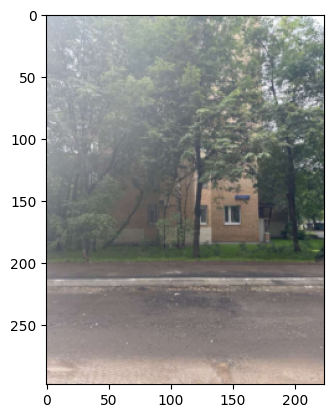

364


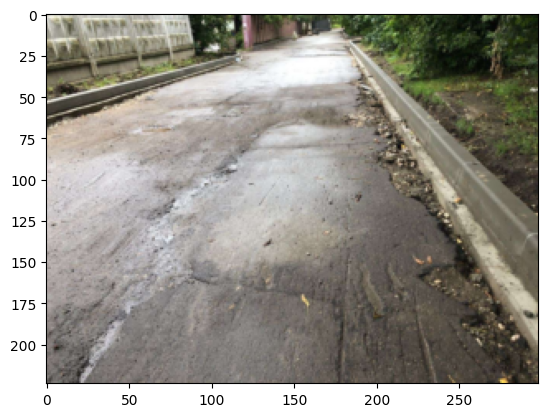

437


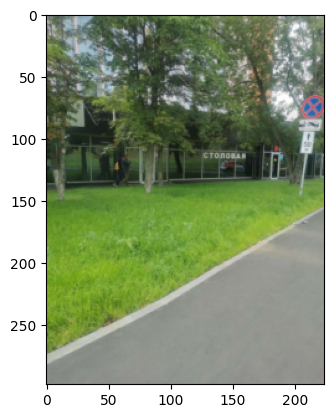

446


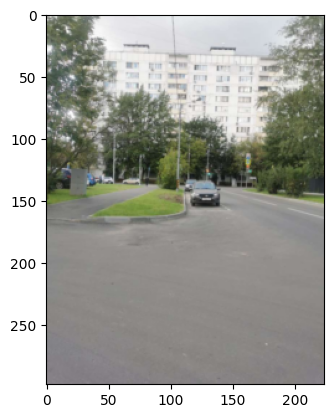

491


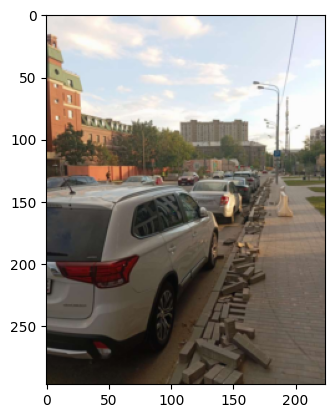

514


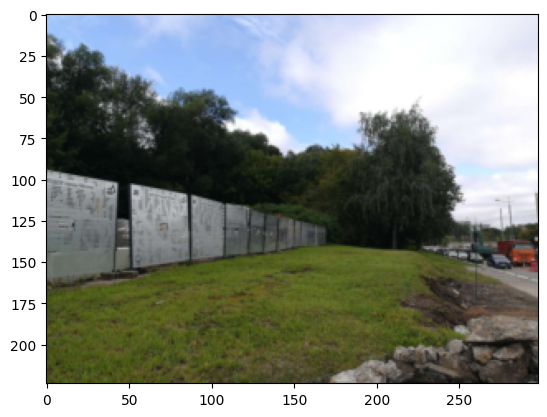

526


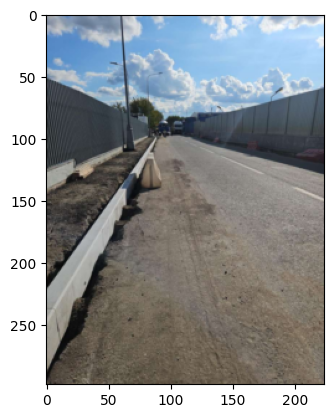

528


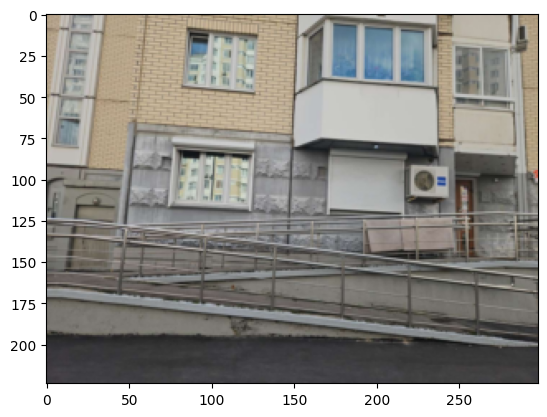

565


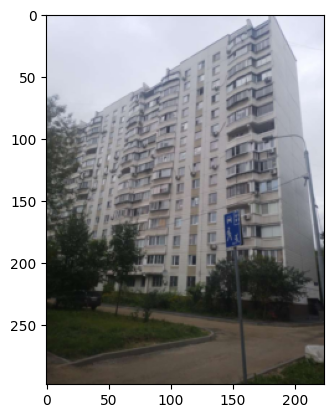

566


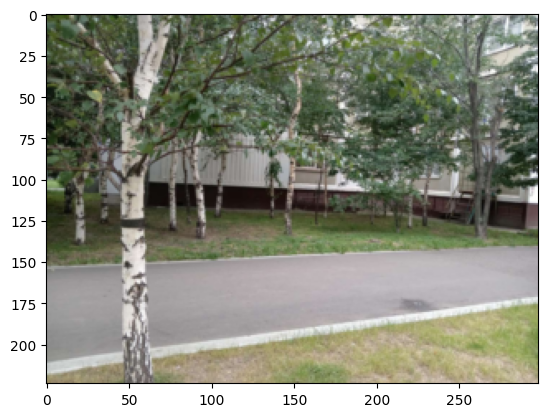

587


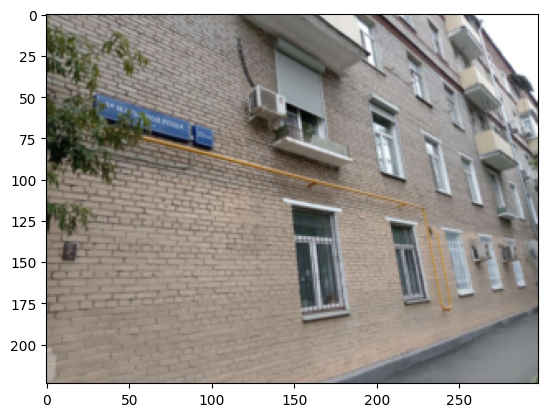

589


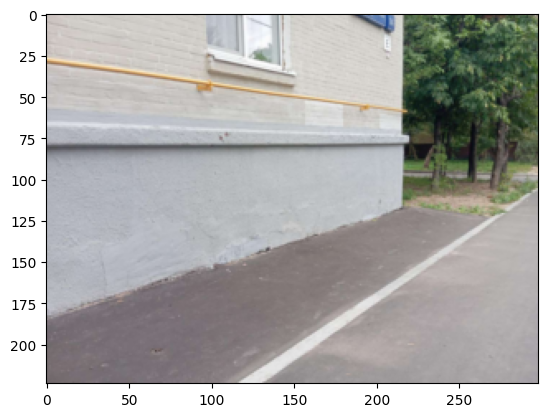

621


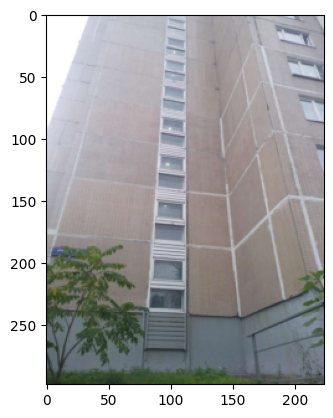

623


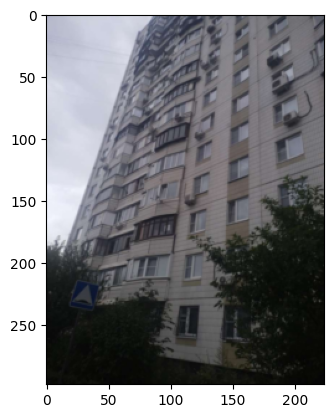

634


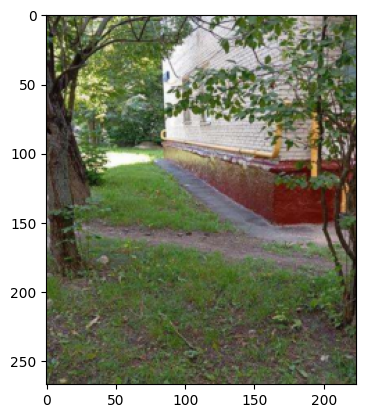

658


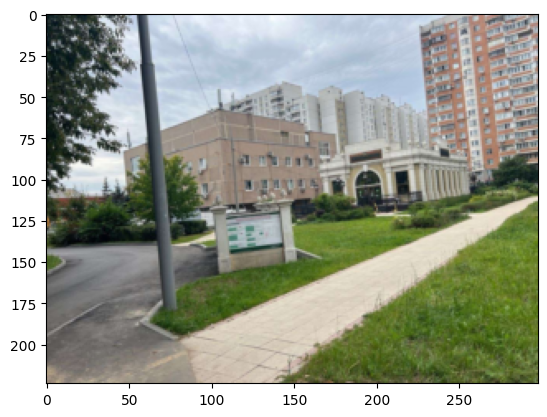

660


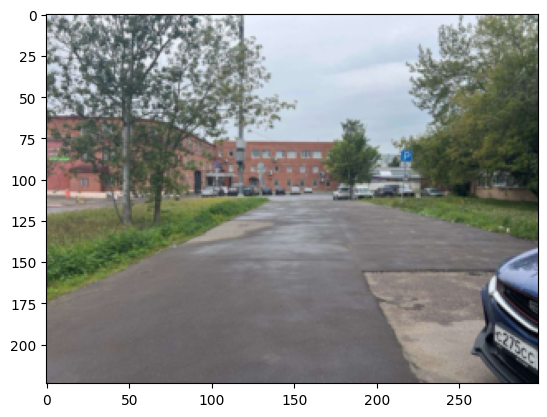

672


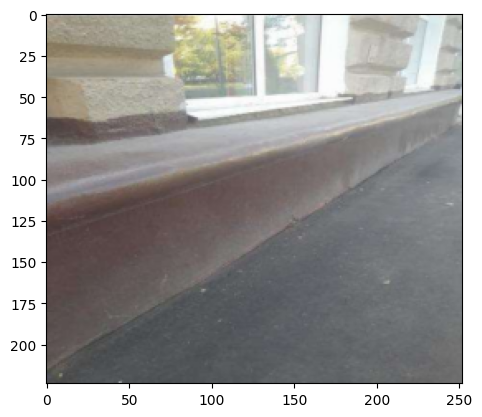

686


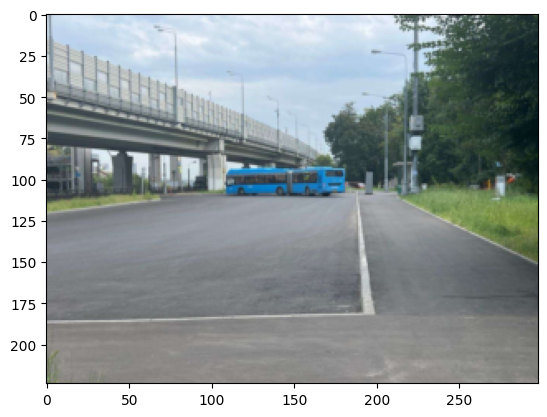

688


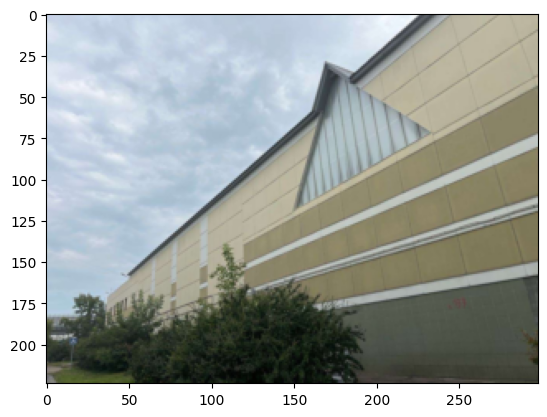

698


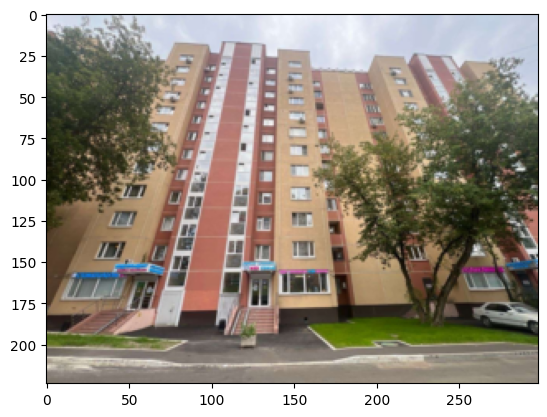

712


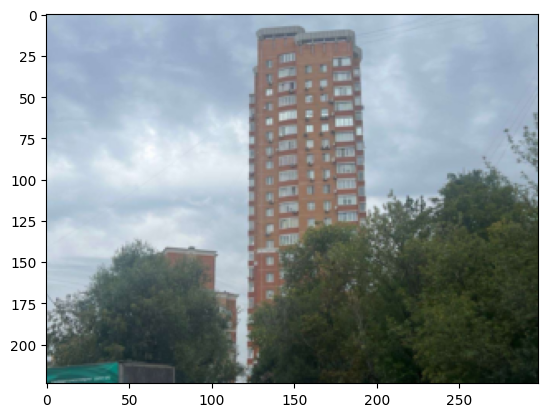

713


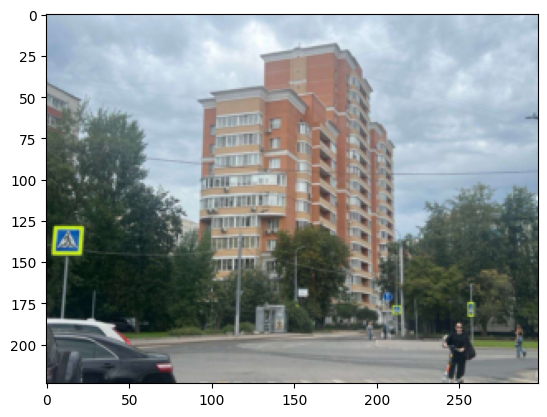

718


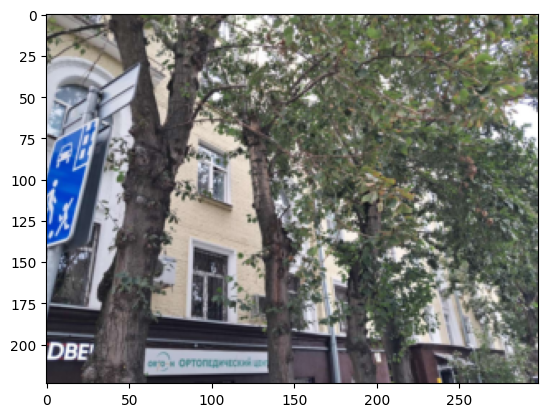

725


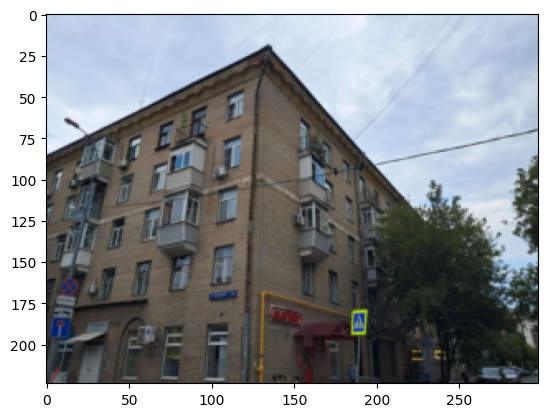

735


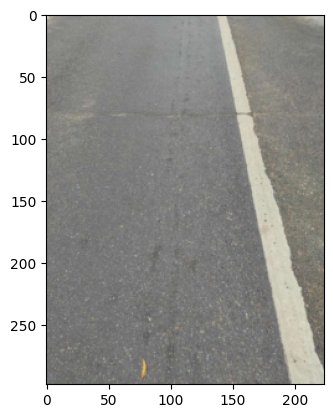

739


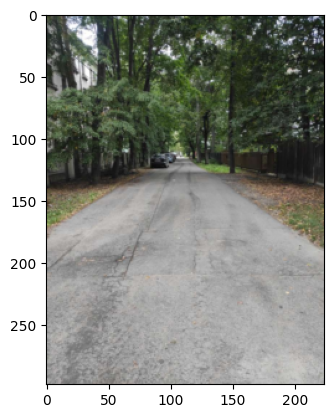

767


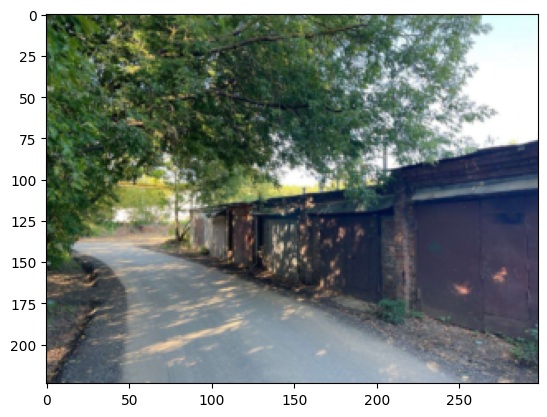

769


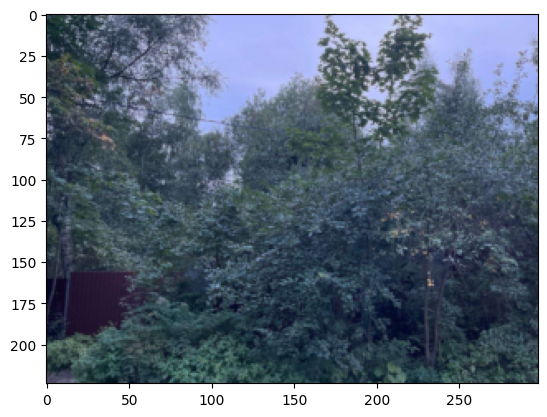

771


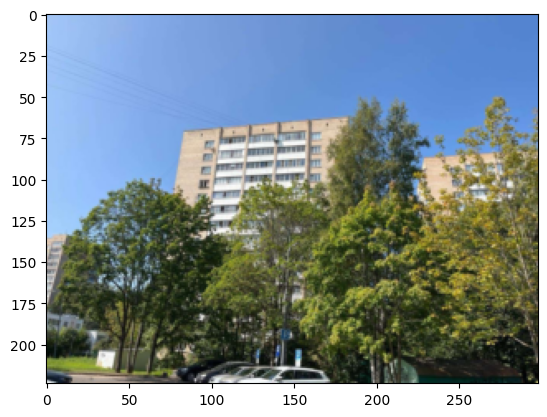

782


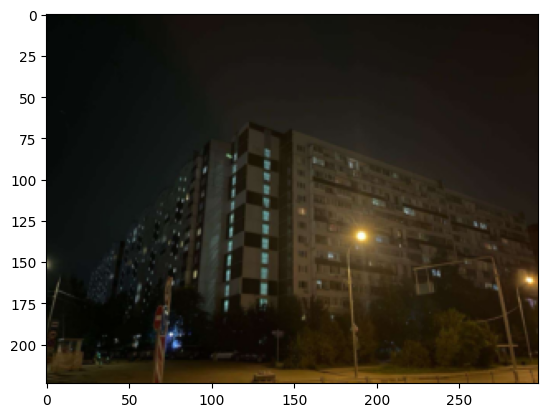

784


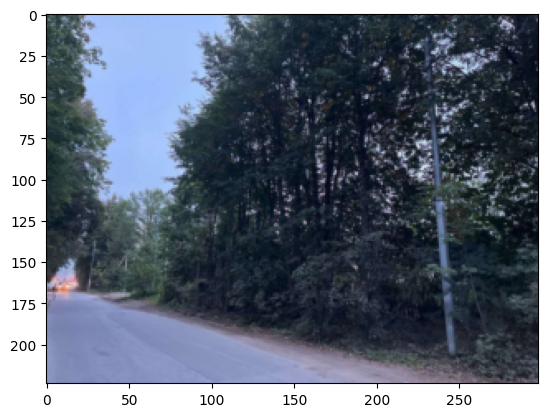

786


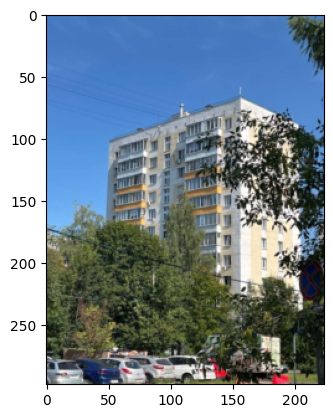

790


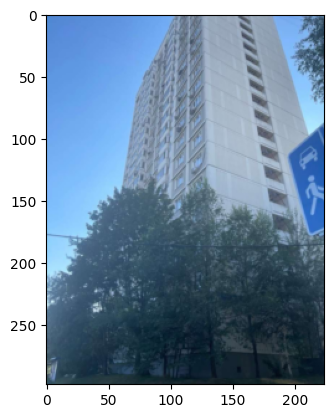

792


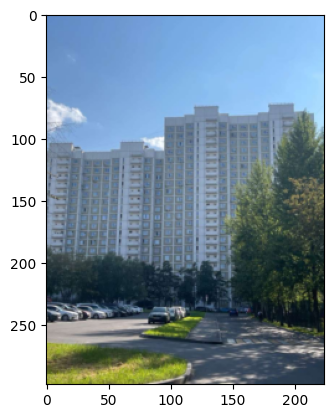

817


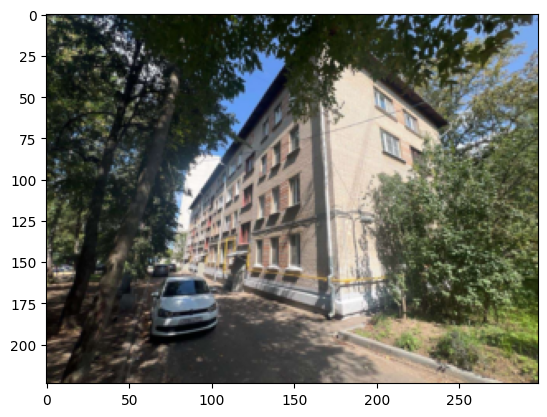

828


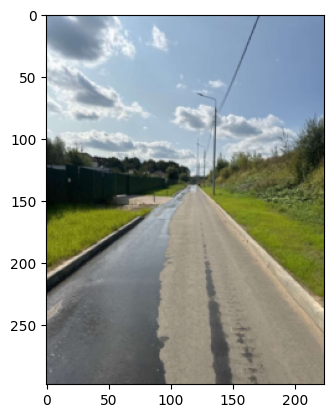

837


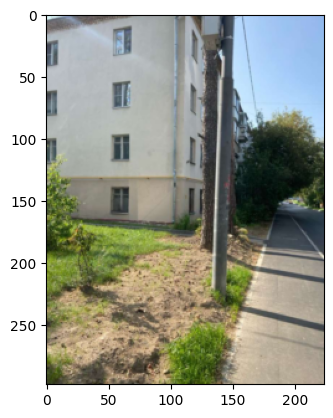

841


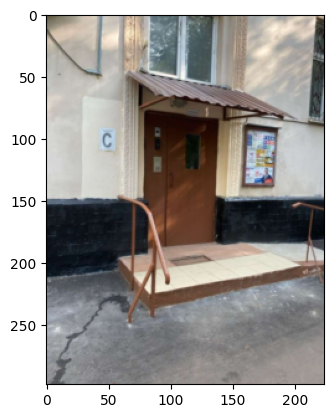

852


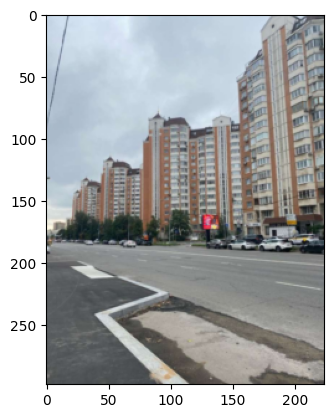

866


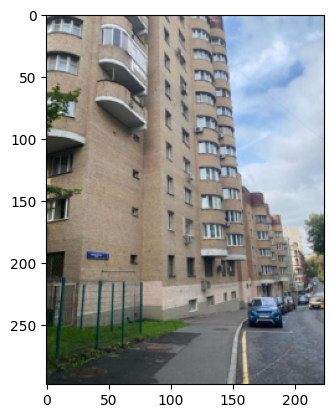

872


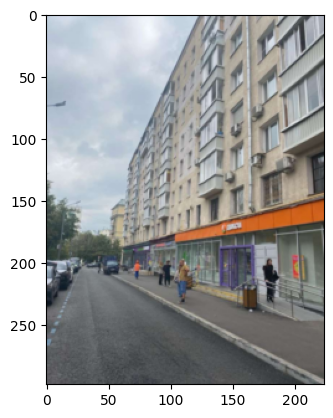

875


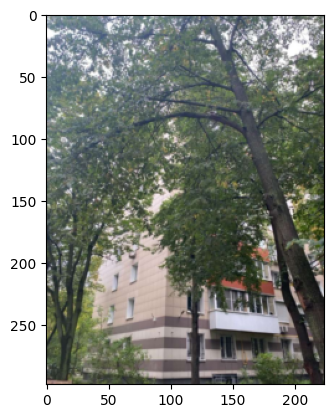

880


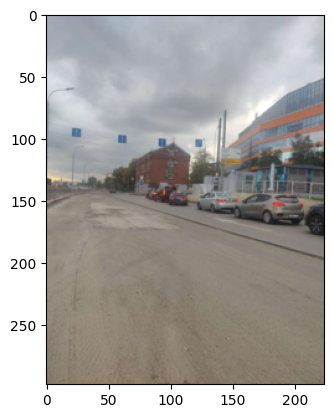

883


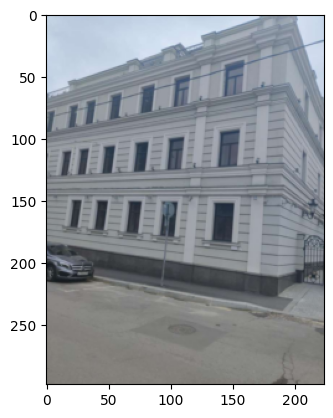

893


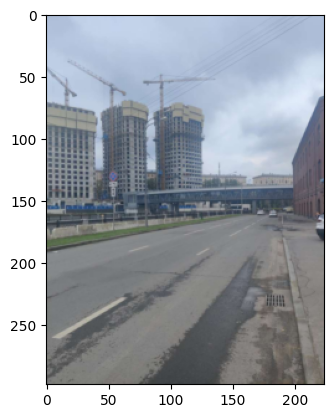

964


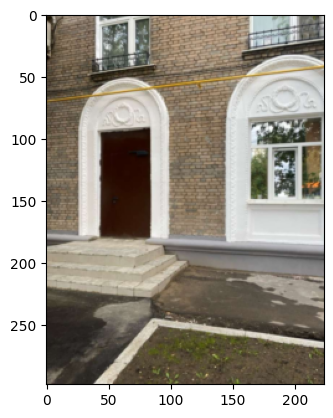

979


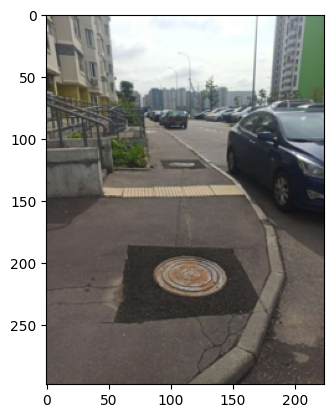

981


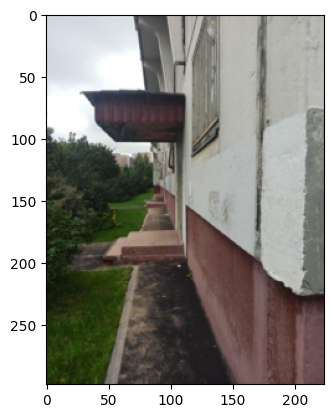

992


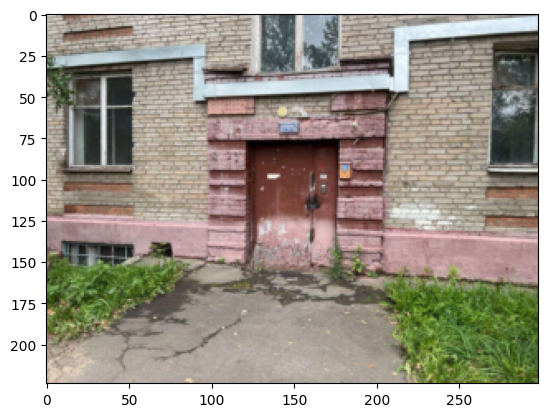

997


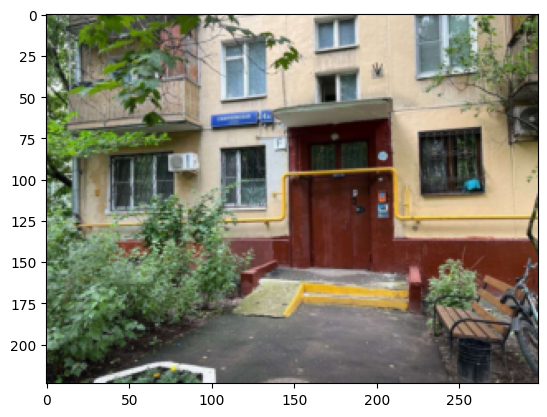

1029


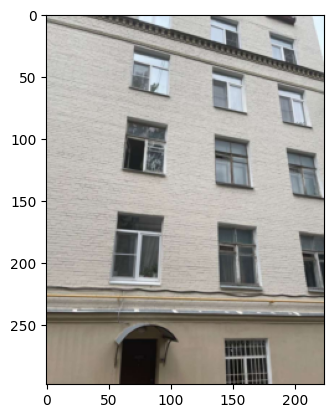

1032


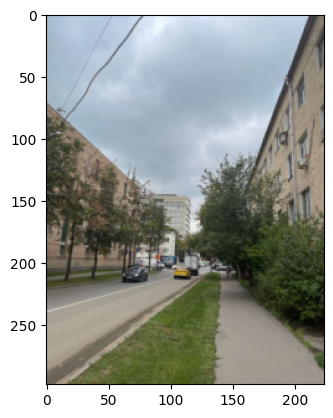

1039


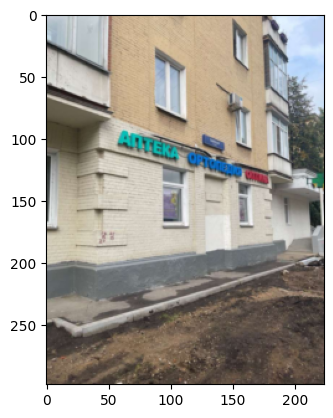

1069


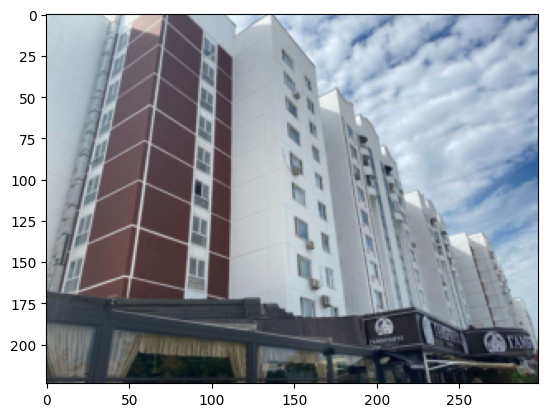

1444


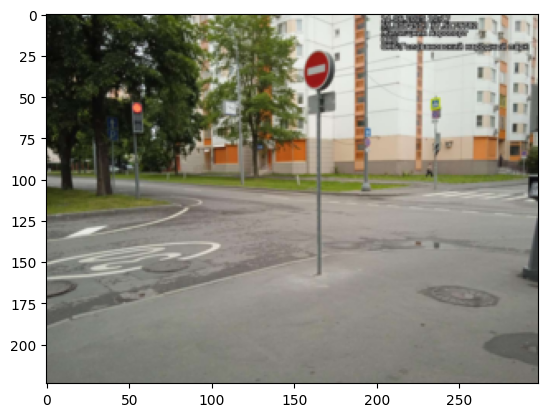

1636


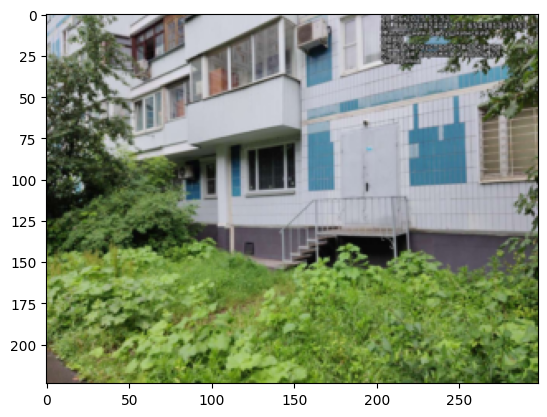


165
57
0.34545454545454546


In [ ]:
k = 0
d = test_ds
for ind in range(len(ds)):
    if ind not in d.indices:
        continue
    if data.iloc[ds.orig_indices[ind]].attr_val == 0:
        k += 1
        print(ind)
        plt.imshow(facade[ind][0])
        plt.show()

print()
print(len(d))
print(k)
print(k / len(d))

In [ ]:
ind = 698
plt.imshow(facade[ind][0])
plt.show()
print(facade[ind][1])
print(facade.orig_indices[ind])
row = data.iloc[facade.orig_indices[ind]]
image_path = os.path.join(root_dir, img_dir, str(row["ID"]) + "_" + str(row["img_num"]) + ".jpg")

print(predict_image(model, image_path, transform, device))
row

NameError: name 'facade' is not defined

In [ ]:
def predict_image(model, image_path, transform, device, threshold=0.5):
    model.eval()

    image = Image.open(image_path).convert("RGB")
    image = transform(image)

    image = image.unsqueeze(0)  # add batch dimension [1, C, H, W]
    image = image.to(device)

    with torch.no_grad():
        logits = model(image)
        prob = torch.sigmoid(logits).item()
        pred = int(prob > threshold)

    return {
        "probability": prob,
        "prediction": pred
    }

In [ ]:
1882

In [ ]:
img_name = "177107919_6.jpg"
test_img_dir = "images"
image_path = os.path.join(root_dir, test_img_dir, img_name)

predict_image(m, image_path, transform, device)

{'probability': 0.5949867963790894, 'prediction': 1}

In [ ]:
data = pd.read_csv("data/data_final.csv")

NameError: name 'test_ds' is not defined

### мб

In [ ]:
train_test_partition = 0.9
train_val_partition = 0.95
train_size = int(train_test_partition * len(ds))
test_size = len(ds) - train_size
val_size = train_size - int(train_size * train_val_partition)
train_size = int(train_size * train_val_partition)


train_val_idx, test_idx = train_test_split(np.arange(len(ds)),
                                             test_size=test_size,
                                             shuffle=True,
                                             stratify=ds.labels)

train_val_ds = Subset(ds, train_val_idx)
test_ds = Subset(ds, test_idx)

train_idx, val_idx = train_test_split(np.arange(len(train_val_idx)),
                                             test_size=val_size,
                                             shuffle=True)

train_ds = Subset(train_val_ds, train_idx)
val_ds = Subset(train_val_ds, val_idx)


train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=32, shuffle=False)

### Заметки по классам

'Содержание дорог, мафов, остановочных павильонов, опор уно, опор мосгортранс', - вроде норм

'Содержание фасадов нежилых зданий и сооружений', - говно + как отличить от жилых?
    
'Санитария (уборка), освещение ( работает или нет),тпу, полоса отвода жд', - норм

'Содержание строительных площадок', - говно (нет данных)

'Содержание мест проведения работ по комплексному благоустройству', - говно (нет данных)

'Наличие подтоплений', - изи

'Содержание объектов цодд', - говно (можно доработать)

'Нарушение состояния фасада жилых зданий', - норм

'Нарушение содержания объектов гор.моста' - изи (внезапно)

### Нарушения в содержание дорог, МАФов, остановочных павильонов, опор УНО, опор мосгортранс



### Нарушение содержания фасадов нежилых зданий и сооружений



### Нарушение содержания объектов гор.мост



### Нарушения по санитарии, освещению, ТПУ, полосе отвода ж\д:

thresh = 0.9 -> acc = 0.83, bacc = 0.83 -> 0.83 по обоим классам





### Нарушение содержания строительной площадки



### Нарушение содержания мест проведения работ по комплексному благоустройству



### Нарушение содержания мест проведения работ по ремонту инженерных сооружений



### Наличие подтоплений



### Нарушение содержания объектов ЦОДД



### Нарушение содержания рекламных конструкций



### Нарушение состояния фасада жилых зданий - AUC 0.92



### Наличие сухостойных деревьев (только деревья)



### Неудовлетворительное содержание ОЛХ



In [ ]:
data["attr"].value_counts()

attr
Нарушение содержания фасадов нежилых зданий и сооружений                                    6990
Нарушения в содержание дорог, МАФов, остановочных павильонов, опор УНО, опор мосгортранс    3763
Нарушения по санитарии, освещению, ТПУ, полосе отвода ж\д                                   3132
Нарушение состояния фасада жилых зданий                                                     2068
Нарушение содержания объектов ЦОДД                                                          1707
Нарушение содержания объектов гор.моста                                                     1527
Нарушение содержания мест проведения работ по ремонту инженерных сооружений                 1382
Наличие подтоплений                                                                         1166
Нарушение содержания рекламных конструкций                                                  1073
Нарушение содержания мест проведения работ по комплексному благоустройству                   859
Нарушение содержания стро

In [ ]:
data[data["attr"] == "Нарушение содержания объектов ЦОДД"]["attr_val"].mean()

0.4305799648506151